# Mounting google drive to get the outputed video

In [ ]:
#  from google.colab import drive
# drive.mount('/content/drive')

# Install Detectron2's dependencies 

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 24 kB/s 
     |████████████████████████████████| 6.6 MB 37.7 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.4 MB/s 
  Created wheel fo

In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 733 kB/s 
     |████████████████████████████████| 49 kB 2.8 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20211023-py3-none-any.whl size=60947 sha256=87d1920a125cbf8ddac5cfe637621c0d512e326fee7bb1c7950562bda793f1e7
  Stored in directory: /root/.cache/pip/wheels/16/98/fc/252d62cab6263c719120e06b28f3378af59b52ce7a20e81852
Successfully built fvcore


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.comm import get_world_size, is_main_process
from detectron2.utils.logger import setup_logger
from detectron2.utils.logger import log_every_n_seconds
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.evaluation.coco_evaluation import COCOEvaluator
from detectron2.evaluation import COCOEvaluator

from torch import nn
from google.colab.patches import cv2_imshow
# from collections import OrderedDict, abc
from contextlib import ExitStack, contextmanager
from typing import List, Union

# import some common libraries
import numpy as np
import cv2
import random
import os

# import datetime
# import logging
# import time

setup_logger()

torch.cuda.empty_cache()



# Import dataset from Roboflow

In [4]:
!curl -L "https://app.roboflow.com/ds/3Nen7BUk9T?key=bTdmYnqVhx" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1553      0 --:--:-- --:--:-- --:--:--  1553
100 12.5M  100 12.5M    0     0  16.4M      0 --:--:-- --:--:-- --:--:-- 16.4M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/1540318711-amritsar_train_accident_jpg.rf.f84a1b16a5b79c056c983459d2306b97.jpg  
 extracting: test/1_png.rf.b314b964916aa81fd81a9b627613fde1.jpg  
 extracting: test/6_png.rf.b5d886753b7c57e28d6ca19f67571d59.jpg  
 extracting: test/7332226-3x2-940x627_jpg.rf.9fdca9c6f61f942b42bb4fc0a0561a1a.jpg  
 extracting: test/74912501e31044c9a3183f30d362c70c_jpg.rf.2261cecf26c162dbb041431a90084be6.jpg  
 extracting: test/7_png.rf.eea75621d1174297ebe6f341b4cfb5cf.jpg  
 extracting: test/874046-mahim-tracks-100719_jpg.rf.c0dffc1f14aab50315b71de0e966ec6a.jpg

# Divide dataset for training and visualise some pictures

In [5]:
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [11/25 23:12:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/25 23:12:58 d2.data.datasets.coco]: Loaded 356 images in COCO format from /content/train/_annotations.coco.json


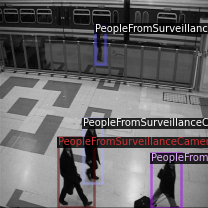

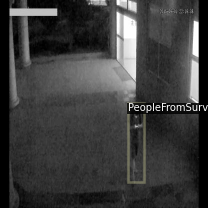

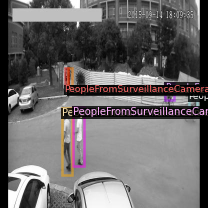

In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Detectron2:  initialization parameters

In [7]:
cfg1 = get_cfg()
cfg1.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))

cfg1.DATASETS.TRAIN = ("my_dataset_train",)
cfg1.DATASETS.TEST = ("my_dataset_val",)
cfg1.DATALOADER.NUM_WORKERS = 2
cfg1.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg1.SOLVER.IMS_PER_BATCH = 2
cfg1.SOLVER.BASE_LR = 0.005
cfg1.SOLVER.WARMUP_ITERS = 50
cfg1.SOLVER.MAX_ITER = 150 #adjust up if val mAP is still rising, adjust down if overfit
cfg1.SOLVER.STEPS = []
cfg1.SOLVER.GAMMA = 0.08
cfg1.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1
cfg1.MODEL.ROI_HEADS.NUM_CLASSES = 1 #your number of classes + 1

cfg1.TEST.EVAL_PERIOD = 50


os.makedirs(cfg1.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg1)
trainer.resume_or_load(resume=False)
trainer.train()
torch.save(trainer.model, 'checkpoint_final.pth')

[11/25 23:13:02 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:15, 27.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[11/25 23:13:23 d2.engine.train_loop]: Starting training from iteration 0
[11/25 23:14:12 d2.utils.events]:  eta: 0:05:31  iter: 19  total_loss: 0.169  loss_cls: 0.062  loss_box_reg: 0.000  loss_rpn_cls: 0.041  loss_rpn_loc: 0.015  time: 2.4632  data_time: 0.0146  lr: 0.001903  max_mem: 4213M
[11/25 23:15:01 d2.utils.events]:  eta: 0:04:39  iter: 39  total_loss: 0.113  loss_cls: 0.000  loss_box_reg: 0.000  loss_rpn_cls: 0.058  loss_rpn_loc: 0.041  time: 2.4516  data_time: 0.0068  lr: 0.003901  max_mem: 4213M
WARNING [11/25 23:15:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/25 23:15:25 d2.data.datasets.coco]: Loaded 102 images in COCO format from /content/valid/_annotations.coco.json
[11/25 23:15:25 d2.data.build]: Distribution of instances among all 2 categories:
|   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|
| PeopleFromS.. | 0   

# Test on test data

# Visualize the boudary box 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

WARNING [11/25 23:20:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/25 23:20:31 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/test/_annotations.coco.json
--- 0.6626739501953125 seconds ---


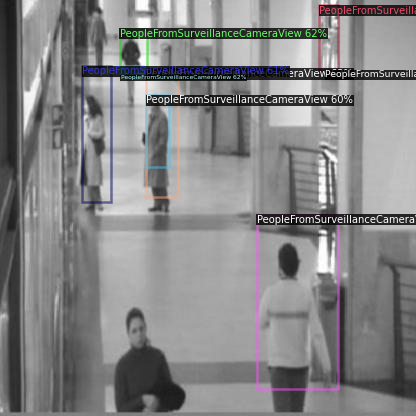

--- 0.5741982460021973 seconds ---


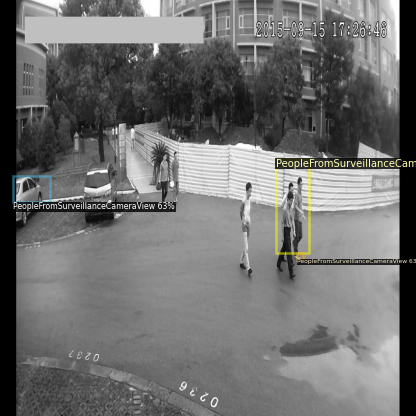

--- 0.5519843101501465 seconds ---


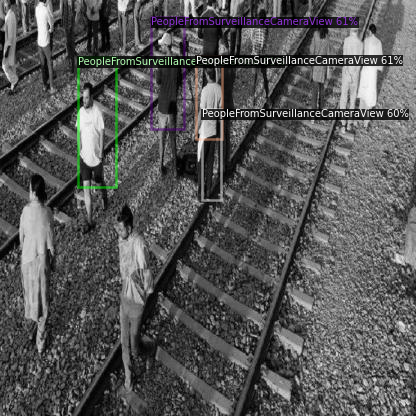

--- 0.5394811630249023 seconds ---


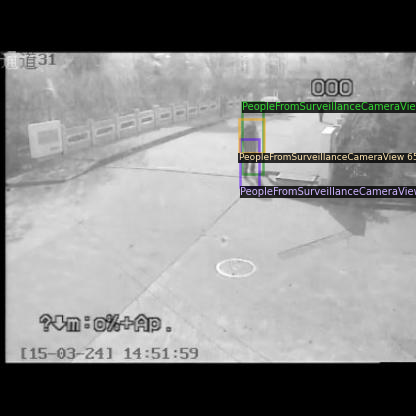

--- 0.5490858554840088 seconds ---


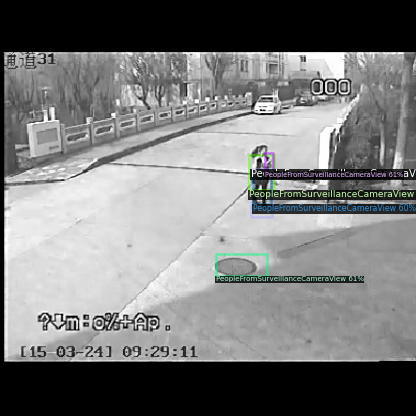

--- 0.5546865463256836 seconds ---


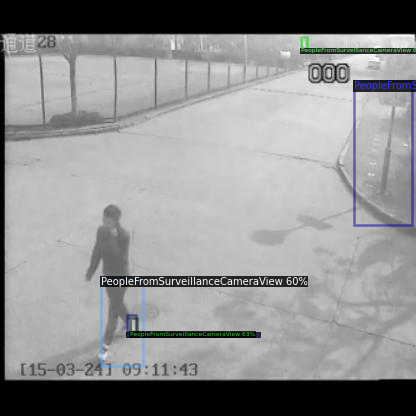

--- 0.5446746349334717 seconds ---


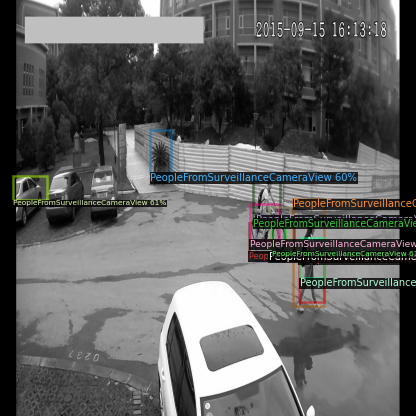

--- 0.5606231689453125 seconds ---


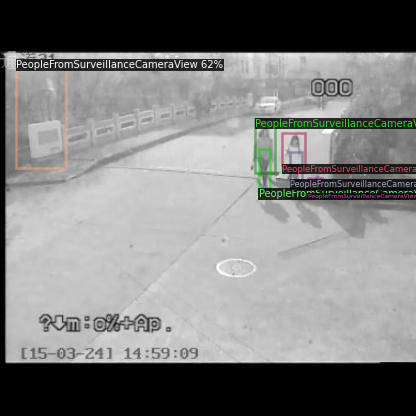

--- 0.5555381774902344 seconds ---


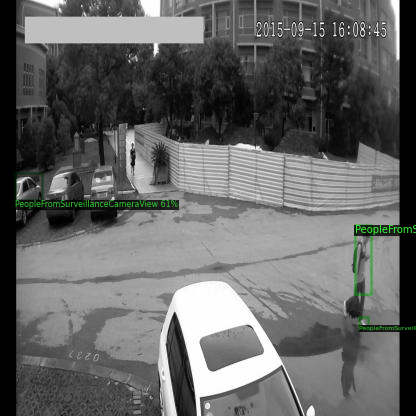

--- 0.5579419136047363 seconds ---


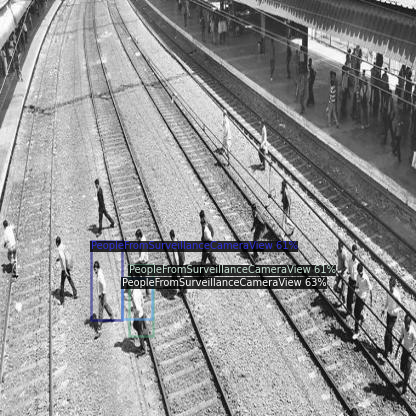

--- 0.5472521781921387 seconds ---


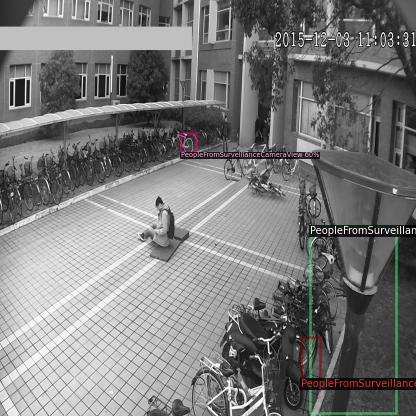

--- 0.5550878047943115 seconds ---


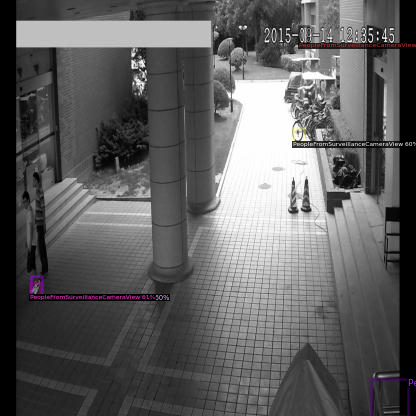

--- 0.5495600700378418 seconds ---


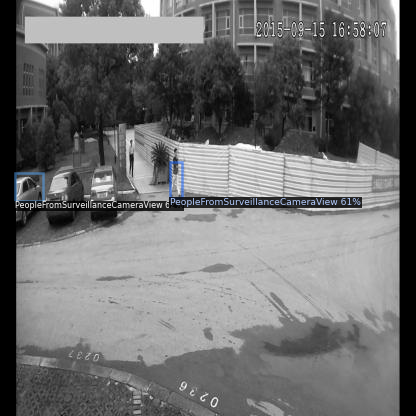

--- 0.5610053539276123 seconds ---


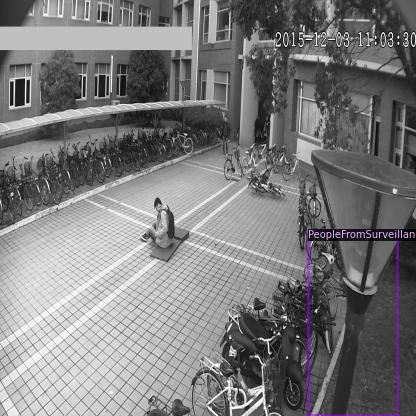

--- 0.5517010688781738 seconds ---


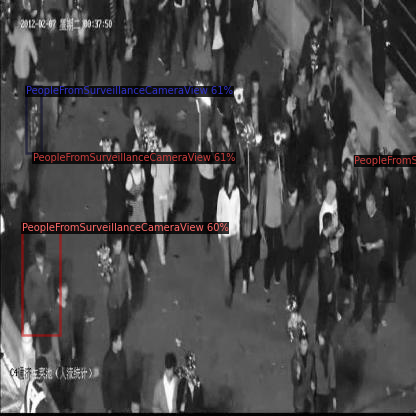

--- 0.5474584102630615 seconds ---


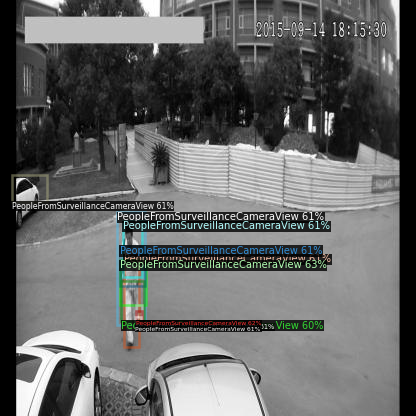

--- 0.5509569644927979 seconds ---


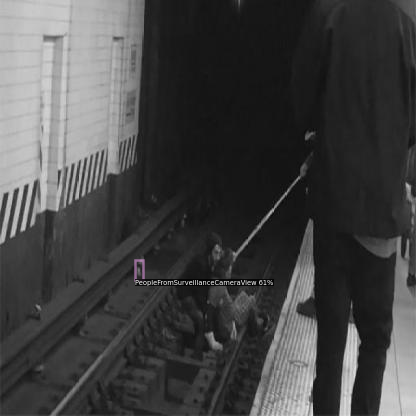

--- 0.557835578918457 seconds ---


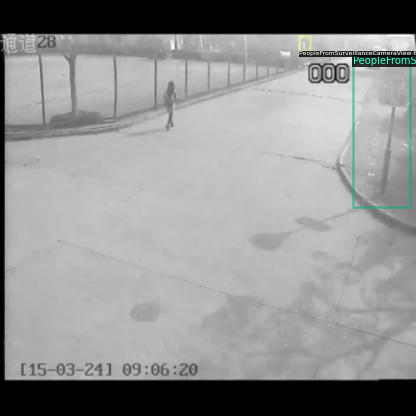

--- 0.5451147556304932 seconds ---


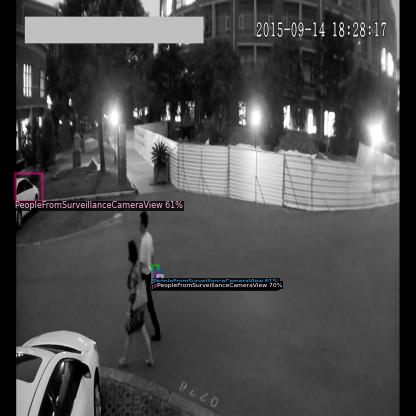

--- 0.5546197891235352 seconds ---


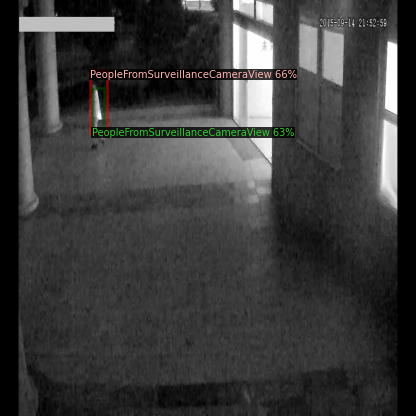

In [10]:
import time
cfg1.MODEL.ROI_HEADS.SCORE_THRESH_TEST =0.6
predictor = DefaultPredictor(cfg1)
from detectron2.utils.visualizer import ColorMode
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
dataset_dicts = DatasetCatalog.get("my_dataset_test")


for d in random.sample(dataset_dicts,20):    
    im = cv2.imread(d["file_name"])
    start_time = time.time()
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    finish_time=time.time()

    print("--- %s seconds ---" % (finish_time - start_time))
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_test_metadata, 
                   scale=1, 
                  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )

    # if outputs["instances"].pred_classes != 0 :
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [11]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
cfg1.MODEL.ROI_HEADS.SCORE_THRESH_TEST =0.6
evaluator = COCOEvaluator("my_dataset_test",cfg1,distributed=True, output_dir="./output")
val_loader = build_detection_test_loader(cfg1,"my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

WARNING [11/25 23:20:46 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/25 23:20:46 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/test/_annotations.coco.json
[11/25 23:20:46 d2.data.common]: Serializing 50 elements to byte tensors and concatenating them all ...
[11/25 23:20:46 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/25 23:20:46 d2.evaluation.evaluator]: Start inference on 50 images
[11/25 23:20:52 d2.evaluation.evaluator]: Inference done 11/50. 0.5369 s / img. ETA=0:00:21
[11/25 23:20:58 d2.evaluation.evaluator]: Inference done 21/50. 0.5360 s / img. ETA=0:00:15
[11/25 23:21:03 d2.evaluation.evaluator]: Inference done 31/50. 0.5371 s / img. ETA=0:00:10
[11/25 23:21:09 d2.evaluation.evaluator]: Inference done 41/50. 0.5371 s / img. ETA=0:00:04
[11/25 23:21:14 d2.evaluation.evaluator]: Total inference time: 0:00:24.369278 (0.541540 s / img per device, on 1 devices)
[11/25 23:21:14

# Visualization model performance using Tensorboard

In [12]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Import the downloaded video from youtube and then upload it to google drive or upload it directly on colab 

# Results Enhancement (Multiple boxes problem)

In [14]:
import torch
from torchvision.ops import nms

my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
dataset_dicts = DatasetCatalog.get("my_dataset_test")
import json
import pandas as pd
output_df = pd.read_json('coco_instances_results.json')
image_idx = 9
boxes = torch.tensor(list(output_df[output_df['image_id']==image_idx].bbox), dtype=torch.float32)
print(len(boxes))
scores = torch.tensor(list(output_df[output_df['image_id']==image_idx].score), dtype=torch.float32)

# Non-maximum suppression using intersection over union threshold
max_idx = nms(boxes = boxes, scores = scores, iou_threshold=0.5)

new_output = output_df[output_df['image_id']==image_idx].iloc[max_idx[0].item()]


WARNING [11/25 23:22:11 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/25 23:22:11 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/test/_annotations.coco.json
17


### Before

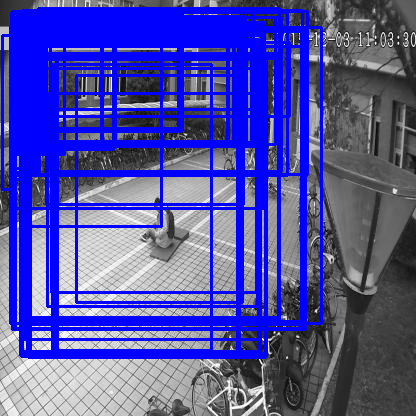

In [15]:
im = cv2.imread(dataset_dicts[image_idx]['file_name'])
for box in output_df['bbox']:
  # print(box[0][0])
  pt1 = (int(box[0]), int(box[1]))
  pt2 = (int(box[2]), int(box[3]))

  cv2.rectangle(im, pt1, pt2, (255,0,0), 2)
cv2_imshow(im)

### After

(260, 356)


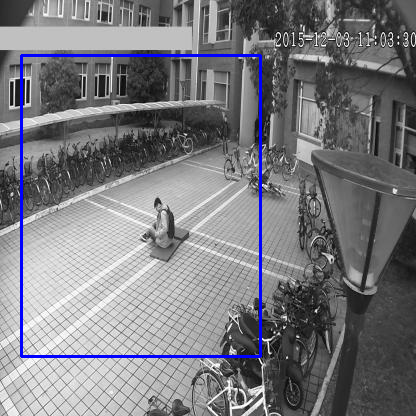

In [16]:
im = cv2.imread(dataset_dicts[image_idx]['file_name'])
pt1 = (int(new_output['bbox'][0]), int(new_output['bbox'][1]))
pt2 = (int(new_output['bbox'][2]), int(new_output['bbox'][3]))
print(pt1)
cv2.rectangle(im, pt1, pt2, (255,0,0), 2)
cv2_imshow( im)

# Deploy the model on real time video from train railways 

#### (commented as it was needed one time to store the video)

In [ ]:
# def danger_zone(frame, danger=False):
   
#     pts = np.array([[0, 80],
#                 [0, 275], 
#                 #[220, frame.shape[0]],
#                 [350, 0], 
#                 [250, 0]],
#                np.int32)
  
#     pts = pts.reshape((-1, 1, 2))

#     isClosed = True

#     # Blue color in BGR
#     if danger == True:
#       color = (255, 0, 0)
#     else:
#       color = (0, 0, 255)

#     # Line thickness of 2 px
#     thickness = 2

#     # Using cv2.polylines() method
#     # Draw a Blue polygon with 
#     # thickness of 5 px
#     image2 = cv2.polylines(frame, [pts], 
#                           isClosed, color, thickness)

#     return image2
    

In [ ]:
## video (Man jumps level crossing barrier ) link  : https://www.youtube.com/watch?v=qeC56DLPxR4

In [ ]:
# # Extract video properties
# video = cv2.VideoCapture('video2.mp4')

# width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
# height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
# frames_per_second = video.get(cv2.CAP_PROP_FPS)
# num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# # Initialize video writer
# video_writer = cv2.VideoWriter('out23.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)
# predictor = DefaultPredictor(cfg1)

# # Initialize visualizer
# v = VideoVisualizer(MetadataCatalog.get(cfg1.DATASETS.TRAIN[0]), ColorMode.IMAGE)

# objects_boxes_coords = [] 
# objects_boxes_outputs = []
# def runOnVideo(video, maxFrames):
#     """ Runs the predictor on every frame in the video (unless maxFrames is given),
#     and returns the frame with the predictions drawn.
#     """

#     readFrames = 0
#     while True:
#         hasFrame, frame = video.read()
#         if not hasFrame:
#             break

#         # Get prediction results for this frame
#         outputs = predictor(frame)

#         ## intersection detection
#         pp = Polygon([(0, 275),
#         (0, frame.shape[0]), 
#         (220, frame.shape[0]),
#         (350, 0), 
#         (250, 0)])

#         box_list = []
#         for elem in outputs["instances"].pred_boxes:
            
#           x1, y1, x2, y2 = elem[0].item(), elem[1].item(), elem[2].item(), elem[3].item() 
#           temp1 = (x1,y1)
#           temp2 = (x1,y2)
#           temp3 = (x2,y1)
#           temp4 = (x2,y2)
#           box_list. append(Polygon([temp1, temp2, temp3, temp4] ) )
            
#         danger = False
#         for rec in box_list: 
#           print(rec, " : ", pp.intersects(rec))
#           if pp.intersects(rec) == True:
#             danger = True
#             break

        

#         # Make sure the frame is colored
#         frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

#         # Draw a visualization of the predictions using the video visualizer
#         visualization = v.draw_instance_predictions(danger_zone1(frame, danger=danger), outputs["instances"].to("cpu"))


#         # Convert Matplotlib RGB format to OpenCV BGR format
#         visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)


#         objects_boxes_coords.append(outputs["instances"].pred_boxes)
#         objects_boxes_outputs.append(outputs["instances"])

        
#         yield visualization

#         readFrames += 1
#         if readFrames > maxFrames:
#             break

# # Create a cut-off for debugging
# num_frames = 250

# # Enumerate the frames of the video
# for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

#     # Write to video file
#     video_writer.write(visualization)

# # Release resources
# video.release()
# video_writer.release()
# cv2.destroyAllWindows()